In [ ]:
import kagglehub
import kaggle
from sklearn.metrics import classification_report, ConfusionMatrixDisplay

import math

import torch
import torchvision
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision import datasets
from torchvision import transforms as T
import torchvision.models as models

import mlflow      
import mlflow.pytorch  

# Для чтения изображений с диска
from torchvision import io # input/output
import torchutils as tu
import json
import numpy as np
import matplotlib.pyplot as plt
import mplcyberpunk
plt.style.use('cyberpunk')

/home/andre/Elbrus-DataScience/lessons/project_elb/nn_project_stars_25/env/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def plot_history(hist):
    fig, ax = plt.subplots(1, 2, figsize=(20,10))
    ax[0].plot(hist['train_loss'], label='train_loss')
    ax[0].plot(hist['valid_loss'], label='valid_loss')
    ax[0].set_title(f'Loss on epochs {len(hist['train_loss'])}')
    ax[0].grid(True)
    ax[0].legend()

    ax[1].plot(hist['train_acc'], label='train_acc')
    ax[1].plot(hist['valid_acc'], label='valid_acc')
    ax[1].set_title(f'Accuracy on epochs {len(hist['valid_acc'])}')
    ax[1].grid(True)
    ax[1].legend()

    plt.show()

In [3]:
def fit(
        model: torch.nn.Module, 
        n_epochs: int, 
        optimizer: torch.optim.Optimizer,
        train_loader: DataLoader,
        valid_loader: DataLoader, 
        history=None
        ) -> dict:
    """Function to fit model

    Returns:
        train_losses: list of train losses per epoch
        valid_losses: list of valid losses per epoch
        train_acc: list of train accuracy per epoch
        valid_acc: list of valid accuracy per epoch
    """

    history = history or {
        'train_loss': [], #list of train losses per epoch
        'valid_loss': [], # list of valid losses per epoch
        'train_acc': [], # list of train accuracy per epoch
        'valid_acc': [] # list of valid accuracy per epoch       
    }

    # train_loss = []
    # valid_loss = []
    # train_metric = []
    # valid_metric = [] 

    for epoch in range(n_epochs):
        model.train()
        batch_loss = []
        batch_acc = []
        # Полезно очистить кэш перед каждой эпохой
        torch.cuda.empty_cache()

        for images, labels in train_loader:
            # передаем переменные в GPU
            images = images.to(DEVICE)
            labels = labels.to(DEVICE)

            # считаем loss и metrics
            y_pred = model(images)
            loss = criterion(y_pred, labels)
            
            # только на обучении очистка градиента, backward и новый шаг
            optimizer.zero_grad()
            loss.backward() # расчет в какую сторону нужно изменить каждый из весов чтобы уменьшить ошибку
            optimizer.step() # Оптимизатор делает шаг в нужном направлении

            batch_loss.append(loss.item())
            batch_acc.append((y_pred.argmax(dim=1) == labels).float().mean().item())


        train_loss = np.mean(batch_loss)
        train_acc = np.mean(batch_acc)

        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)

        # режим тестирования
        model.eval()
        batch_loss = []
        batch_acc = []

        with torch.no_grad(): # отключает градиенты и ускоряет работу
            for images, labels in valid_loader:
                # передаем переменные в GPU
                images = images.to(DEVICE)
                labels = labels.to(DEVICE)

                # считаем loss и metrics
                y_pred = model(images)
                loss = criterion(y_pred, labels)
                
                batch_loss.append(loss.item())
                batch_acc.append((y_pred.argmax(dim=1) == labels).float().mean().item())

            valid_loss = np.mean(batch_loss)
            valid_acc = np.mean(batch_acc)
            history['valid_loss'].append(valid_loss)
            history['valid_acc'].append(valid_acc)

            # scheduler.step(valid_loss) 

        # [MLflow] Логируем метрики. Шаг лога 1 эпоха
        if use_mlflow:
            mlflow.log_metric('train_loss', train_loss, step=epoch)
            mlflow.log_metric('train_acc', train_acc, step=epoch)
            mlflow.log_metric('valid_loss', valid_loss, step=epoch)
            mlflow.log_metric('valid_acc', valid_acc, step=epoch)

        # печать лога по эпохам
        print(
            f"{'_-'*8} Epoch - {epoch}/{n_epochs}{'-_'*8} | \n"
            f"train_loss - {train_loss:.5f}, train_acc - {train_acc:.5f} | \n"
            f"valid_loss - {valid_loss:.5f}, valid_acc - {valid_acc:.5f} | \n"
            f"{'_-'*8}{'*'*10}{'-_'*8} | "
            )
        # print(f"Epoch {epoch+1}/{n_epochs}: train_loss={train_loss:.4f}, valid_acc={valid_acc:.4f}")

    # plot_history(history)
    return history

In [4]:
# [MLflow] Флажок, чтобы включать/выключать логирование
use_mlflow = True

# Здесь можно выбрать или задать название эксперимента
# (если такового нет, MLflow создаст новый)
mlflow_experiment_name = "SIC100"

Скачиваем датасет

In [5]:
# !kaggle datasets download -d gpiosenka/sports-classification --unzip -p ../data/sic100

Изображения 224 х 224 х 3

In [6]:
!ls -R ../data/sic100 | grep /

../data/sic100:
../data/sic100/test:
../data/sic100/test/air hockey:
../data/sic100/test/ampute football:
../data/sic100/test/archery:
../data/sic100/test/arm wrestling:
../data/sic100/test/axe throwing:
../data/sic100/test/balance beam:
../data/sic100/test/barell racing:
../data/sic100/test/baseball:
../data/sic100/test/basketball:
../data/sic100/test/baton twirling:
../data/sic100/test/bike polo:
../data/sic100/test/billiards:
../data/sic100/test/bmx:
../data/sic100/test/bobsled:
../data/sic100/test/bowling:
../data/sic100/test/boxing:
../data/sic100/test/bull riding:
../data/sic100/test/bungee jumping:
../data/sic100/test/canoe slamon:
../data/sic100/test/cheerleading:
../data/sic100/test/chuckwagon racing:
../data/sic100/test/cricket:
../data/sic100/test/croquet:
../data/sic100/test/curling:
../data/sic100/test/disc golf:
../data/sic100/test/fencing:
../data/sic100/test/field hockey:
../data/sic100/test/figure skating men:
../data/sic100/test/figure skating pairs:
../data/sic100/te

Задаем параметры

In [7]:
BATCH_SIZE = 64

config = {
    'batch_size': BATCH_SIZE,
    'learning_rate': 0.001,
    'epochs': 15,
    'device':  'cuda' if torch.cuda.is_available() else 'cpu',
    'data_dir': 'data/',
    'log_dir': 'runs/experiment1'
}

# ниже строка не обязательна, но часто device хранят еще и в отдельной переменной, так как часто обращаются к ней
DEVICE = config['device'] #'cuda' if torch.cuda.is_available() else 'cpu'

Берем стандартные mean b std для ResNet

In [8]:
# стандатные веса для резнет
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

Создаем DataLoader и делаем аугментацию к изображениям тренировочной выборки

In [9]:
# делаем трасформеры для трейна и валида

transform_train = T.Compose([
    T.Resize((256, 256)),          # Сначала берем картинку чуть больше
    T.RandomResizedCrop(224),      # Вырезаем случайный кусок 224x224 (зум и сдвиг)
    T.RandomHorizontalFlip(p=0.5), # Зеркалим (право/лево)
    T.RandomRotation(15),          # Поворачиваем на +- 15 градусов
    T.ColorJitter(brightness=0.1), # Слегка меняем яркость
    T.ToTensor(),
    T.Normalize(mean=mean, std=std)
])

transform_valid = T.Compose(
    [
        T.Resize(256),         # Изменяем размер по короткой стороне, сохраняя пропорции
        T.CenterCrop(224),     # Вырезаем квадрат по центру
        T.ToTensor(),
        T.Normalize(mean=mean, std=std)
    ]
)

In [10]:
# Загружаем датасеты
train_dataset = datasets.ImageFolder(
    '../data/sic100/train',
    transform=transform_train
)
valid_dataset = torchvision.datasets.ImageFolder(
    '../data/sic100/valid',
    transform=transform_valid
)
test_dataset = torchvision.datasets.ImageFolder(
    '../data/sic100/test',
    transform=transform_valid
)

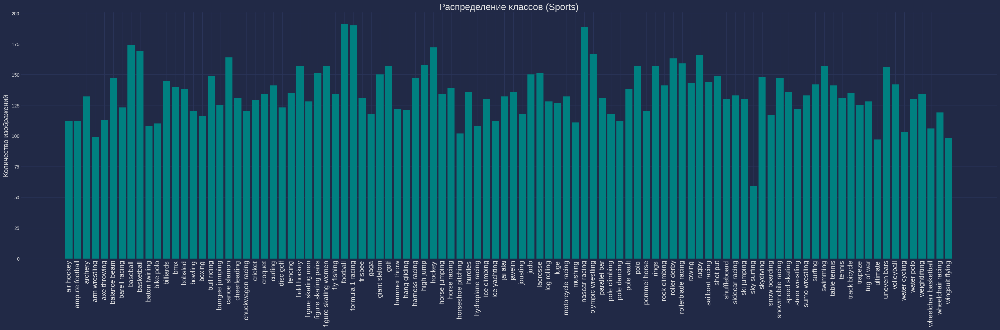

In [148]:
counts = [train_dataset.targets.count(i) for i in range(len(train_dataset.classes))]
names = train_dataset.classes

# 2. Создаем ОЧЕНЬ широкое полотно (ширина 30, высота 8)
plt.figure(figsize=(30, 10))

# 3. Строим вертикальный график
plt.bar(names, counts, color='teal')

# 4. Оформление
plt.title('Распределение классов (Sports)', fontsize=20)
plt.ylabel('Количество изображений', fontsize=15)

# ГЛАВНОЕ: Поворачиваем названия классов на 90 градусов, чтобы они не слиплись
plt.xticks(rotation=90, fontsize=15)

plt.tight_layout()
plt.show()

In [11]:
train_dataset, valid_dataset, test_dataset

(Dataset ImageFolder
     Number of datapoints: 13492
     Root location: ../data/sic100/train
     StandardTransform
 Transform: Compose(
                Resize(size=(256, 256), interpolation=bilinear, max_size=None, antialias=True)
                RandomResizedCrop(size=(224, 224), scale=(0.08, 1.0), ratio=(0.75, 1.3333), interpolation=bilinear, antialias=True)
                RandomHorizontalFlip(p=0.5)
                RandomRotation(degrees=[-15.0, 15.0], interpolation=nearest, expand=False, fill=0)
                ColorJitter(brightness=(0.9, 1.1), contrast=None, saturation=None, hue=None)
                ToTensor()
                Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
            ),
 Dataset ImageFolder
     Number of datapoints: 500
     Root location: ../data/sic100/valid
     StandardTransform
 Transform: Compose(
                Resize(size=256, interpolation=bilinear, max_size=None, antialias=True)
                CenterCrop(size=(224, 224))
      

In [12]:
test_dataset.class_to_idx

{'air hockey': 0,
 'ampute football': 1,
 'archery': 2,
 'arm wrestling': 3,
 'axe throwing': 4,
 'balance beam': 5,
 'barell racing': 6,
 'baseball': 7,
 'basketball': 8,
 'baton twirling': 9,
 'bike polo': 10,
 'billiards': 11,
 'bmx': 12,
 'bobsled': 13,
 'bowling': 14,
 'boxing': 15,
 'bull riding': 16,
 'bungee jumping': 17,
 'canoe slamon': 18,
 'cheerleading': 19,
 'chuckwagon racing': 20,
 'cricket': 21,
 'croquet': 22,
 'curling': 23,
 'disc golf': 24,
 'fencing': 25,
 'field hockey': 26,
 'figure skating men': 27,
 'figure skating pairs': 28,
 'figure skating women': 29,
 'fly fishing': 30,
 'football': 31,
 'formula 1 racing': 32,
 'frisbee': 33,
 'gaga': 34,
 'giant slalom': 35,
 'golf': 36,
 'hammer throw': 37,
 'hang gliding': 38,
 'harness racing': 39,
 'high jump': 40,
 'hockey': 41,
 'horse jumping': 42,
 'horse racing': 43,
 'horseshoe pitching': 44,
 'hurdles': 45,
 'hydroplane racing': 46,
 'ice climbing': 47,
 'ice yachting': 48,
 'jai alai': 49,
 'javelin': 50,
 '

Создаем словарь классов

In [13]:
idx2class= {j: i for i, j in train_dataset.class_to_idx.items()}
idx2class

{0: 'air hockey',
 1: 'ampute football',
 2: 'archery',
 3: 'arm wrestling',
 4: 'axe throwing',
 5: 'balance beam',
 6: 'barell racing',
 7: 'baseball',
 8: 'basketball',
 9: 'baton twirling',
 10: 'bike polo',
 11: 'billiards',
 12: 'bmx',
 13: 'bobsled',
 14: 'bowling',
 15: 'boxing',
 16: 'bull riding',
 17: 'bungee jumping',
 18: 'canoe slamon',
 19: 'cheerleading',
 20: 'chuckwagon racing',
 21: 'cricket',
 22: 'croquet',
 23: 'curling',
 24: 'disc golf',
 25: 'fencing',
 26: 'field hockey',
 27: 'figure skating men',
 28: 'figure skating pairs',
 29: 'figure skating women',
 30: 'fly fishing',
 31: 'football',
 32: 'formula 1 racing',
 33: 'frisbee',
 34: 'gaga',
 35: 'giant slalom',
 36: 'golf',
 37: 'hammer throw',
 38: 'hang gliding',
 39: 'harness racing',
 40: 'high jump',
 41: 'hockey',
 42: 'horse jumping',
 43: 'horse racing',
 44: 'horseshoe pitching',
 45: 'hurdles',
 46: 'hydroplane racing',
 47: 'ice climbing',
 48: 'ice yachting',
 49: 'jai alai',
 50: 'javelin',
 5

In [14]:
print(f'Count classes - {len(train_dataset.class_to_idx)}')

Count classes - 100


In [15]:
# Dataloader
train_loader = DataLoader(train_dataset, batch_size=config['batch_size'], shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=config['batch_size'], shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=config['batch_size'], shuffle=True)

In [16]:
test_batch = next(iter(train_loader))
test_batch_samples = test_batch[0].to(DEVICE) 
test_batch_targets = test_batch[1].to(DEVICE)
test_batch_samples[0].mean(), test_batch_samples[0].std()

(tensor(0.6133, device='cuda:0'), tensor(1.1385, device='cuda:0'))

Создаем экземпляр обученной модели. Берем ResNet18, посмотрим как будет обучаться по времени и нагрузке

In [17]:
# DEFAULT подгрузит лучшие доступные на сегодня предобученные веса
weights = models.ResNet18_Weights.DEFAULT
model = models.resnet18(weights=weights).to(DEVICE)

In [18]:
fake_batch = torch.randn(4, 3, 224, 224)
fake_batch = fake_batch.to(DEVICE)
tu.get_model_summary(model, fake_batch)

Layer                                       Kernel             Output          Params           FLOPs
0_conv1                                   [3, 64, 7, 7]   [4, 64, 112, 112]       9,408   472,055,808
1_bn1                                              [64]   [4, 64, 112, 112]         128    12,845,056
2_relu                                                -   [4, 64, 112, 112]           0             0
3_maxpool                                             -     [4, 64, 56, 56]           0             0
4_layer1.0.Conv2d_conv1                  [64, 64, 3, 3]     [4, 64, 56, 56]      36,864   462,422,016
5_layer1.0.BatchNorm2d_bn1                         [64]     [4, 64, 56, 56]         128     3,211,264
6_layer1.0.ReLU_relu                                  -     [4, 64, 56, 56]           0             0
7_layer1.0.Conv2d_conv2                  [64, 64, 3, 3]     [4, 64, 56, 56]      36,864   462,422,016
8_layer1.0.BatchNorm2d_bn2                         [64]     [4, 64, 56, 56]       

In [19]:
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [20]:
model.fc

Linear(in_features=512, out_features=1000, bias=True)

приходит 512 фич на вход. заменяем последний слой. Классов для предсказания 100

In [21]:
model.fc = nn.Linear(512, 100)
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [22]:
print({p.requires_grad for p in model.parameters()}) 

{True}


Все обучаемые параметры. заморозим все

In [23]:
for param in model.parameters():
    param.requires_grad = False

print({p.requires_grad for p in model.parameters()}) 

{False}


все заморожены. Разморозим последний слой

In [24]:
# «Размораживаем» последний слой
model.fc.weight.requires_grad = True
model.fc.bias.requires_grad = True

In [25]:
print({p.requires_grad for p in model.parameters()}) 

{False, True}


In [26]:
# Проверяем, True должно встретиться только в самом конце
for param in model.parameters():
    print(param.requires_grad)

False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
True
True


In [27]:
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

Обучение модели с последним размороженным слоем. Прооверка на валидационной выборке

In [28]:
# counts = [0] * len(train_dataset.classes)


# for target in train_dataset.targets:
#     counts[target] += 1

# counts_per_class = torch.tensor(counts, dtype=torch.float)

In [29]:
# # Если классы сбалансированы, этот шаг можно пропустить
# class_weights = None 
# # Пример, если хотите учесть дисбаланс:
# weights = 1.0 / torch.tensor(counts_per_class, dtype=torch.float)
# class_weights = (weights / weights.sum() * len(weights)).to(DEVICE)

In [30]:
model.to(DEVICE)
optimizer = torch.optim.AdamW(
    model.parameters(), 
    lr=config['learning_rate'], 
    weight_decay=0.05  # Помогает против переобучения при 100 классах
)
criterion = torch.nn.CrossEntropyLoss(
    label_smoothing=0.1
).to(DEVICE)

In [31]:
if use_mlflow: 
    # Если MLFlow, то 
    mlflow.set_experiment(mlflow_experiment_name) # создаем эксперимент с именем mlflow_experiment_name. задан ранее
    with mlflow.start_run(run_name='SIC100_1'):
        # логгируем это
        mlflow.log_param('batch_size', config['batch_size'])
        mlflow.log_param('learning_rate', config['learning_rate'])
        mlflow.log_param('epochs', config['epochs'])
        mlflow.log_param('device', config['device'])

        # запуск обучения. передаем в том числе train_loader, valid_loader
        history_base = fit(model, config['epochs'], optimizer, train_loader, valid_loader)

        # сохраняем модель в MLFlow
        mlflow.pytorch.log_model(model, 'model')

else:
    history_base = fit(model, config['epochs'], optimizer, train_loader, valid_loader) 

2026/02/13 12:55:46 INFO alembic.runtime.plugins: setup plugin alembic.autogenerate.schemas
2026/02/13 12:55:46 INFO alembic.runtime.plugins: setup plugin alembic.autogenerate.tables
2026/02/13 12:55:46 INFO alembic.runtime.plugins: setup plugin alembic.autogenerate.types
2026/02/13 12:55:46 INFO alembic.runtime.plugins: setup plugin alembic.autogenerate.constraints
2026/02/13 12:55:46 INFO alembic.runtime.plugins: setup plugin alembic.autogenerate.defaults
2026/02/13 12:55:46 INFO alembic.runtime.plugins: setup plugin alembic.autogenerate.comments
2026/02/13 12:55:47 INFO alembic.runtime.migration: Context impl SQLiteImpl.
2026/02/13 12:55:47 INFO alembic.runtime.migration: Will assume non-transactional DDL.


_-_-_-_-_-_-_-_- Epoch - 0/15-_-_-_-_-_-_-_-_ | 
train_loss - 3.62780, train_acc - 0.26649 | 
valid_loss - 2.28998, valid_acc - 0.60021 | 
_-_-_-_-_-_-_-_-**********-_-_-_-_-_-_-_-_ | 
_-_-_-_-_-_-_-_- Epoch - 1/15-_-_-_-_-_-_-_-_ | 
train_loss - 2.58590, train_acc - 0.52613 | 
valid_loss - 1.77285, valid_acc - 0.76638 | 
_-_-_-_-_-_-_-_-**********-_-_-_-_-_-_-_-_ | 
_-_-_-_-_-_-_-_- Epoch - 2/15-_-_-_-_-_-_-_-_ | 
train_loss - 2.31460, train_acc - 0.57959 | 
valid_loss - 1.61407, valid_acc - 0.79192 | 
_-_-_-_-_-_-_-_-**********-_-_-_-_-_-_-_-_ | 
_-_-_-_-_-_-_-_- Epoch - 3/15-_-_-_-_-_-_-_-_ | 
train_loss - 2.18315, train_acc - 0.61480 | 
valid_loss - 1.61195, valid_acc - 0.77299 | 
_-_-_-_-_-_-_-_-**********-_-_-_-_-_-_-_-_ | 
_-_-_-_-_-_-_-_- Epoch - 4/15-_-_-_-_-_-_-_-_ | 
train_loss - 2.10371, train_acc - 0.63516 | 
valid_loss - 1.53201, valid_acc - 0.83534 | 
_-_-_-_-_-_-_-_-**********-_-_-_-_-_-_-_-_ | 
_-_-_-_-_-_-_-_- Epoch - 5/15-_-_-_-_-_-_-_-_ | 
train_loss - 2.06442, trai

2026/02/13 13:04:52 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2026/02/13 13:04:52 WARNING mlflow.pytorch: Saving pytorch model by Pickle or CloudPickle format requires exercising caution because these formats rely on Python's object serialization mechanism, which can execute arbitrary code during deserialization.The recommended safe alternative is to set 'export_model' to True to save the pytorch model using the safe graph model format.


_-_-_-_-_-_-_-_- Epoch - 14/15-_-_-_-_-_-_-_-_ | 
train_loss - 1.92399, train_acc - 0.69093 | 
valid_loss - 1.49519, valid_acc - 0.85276 | 
_-_-_-_-_-_-_-_-**********-_-_-_-_-_-_-_-_ | 


Время обучения базовой модели 9 минут 10 сек.

In [32]:
# сохраняем резултаты
result_history = {}
result_history['Base_model'] = history_base
result_history

{'Base_model': {'train_loss': [np.float64(3.6277950262006424),
   np.float64(2.585901939473446),
   np.float64(2.314598562593144),
   np.float64(2.183151642858135),
   np.float64(2.1037119790841055),
   np.float64(2.0644208322769093),
   np.float64(2.0369288870508635),
   np.float64(2.000731189669026),
   np.float64(1.9929057286248952),
   np.float64(1.9639846380288002),
   np.float64(1.9751953863984602),
   np.float64(1.9476262771687802),
   np.float64(1.9371030601844967),
   np.float64(1.945217642173948),
   np.float64(1.9239856462343043)],
  'valid_loss': [np.float64(2.289980411529541),
   np.float64(1.7728520333766937),
   np.float64(1.6140714585781097),
   np.float64(1.611947238445282),
   np.float64(1.5320143550634384),
   np.float64(1.5164297670125961),
   np.float64(1.5093792527914047),
   np.float64(1.509028360247612),
   np.float64(1.4928340464830399),
   np.float64(1.5001426935195923),
   np.float64(1.4955522567033768),
   np.float64(1.4964305758476257),
   np.float64(1.5191

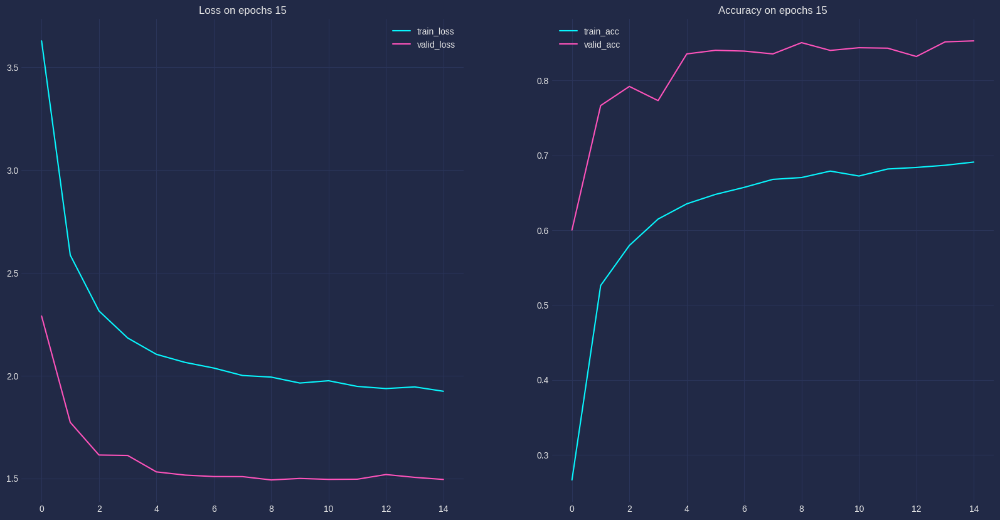

In [33]:
# метрики на базовой модели
plot_history(history_base)

Валидационный данные на предобученной модеи показали 0,85 точности, и лосс - 1.57.

In [34]:
def get_classification_report(model, loader, device, classes):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in loader:
            outputs = model(inputs.to(device))
            preds = torch.argmax(outputs, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.numpy())

    print(classification_report(all_labels, all_preds, target_names=classes))

get_classification_report(model, valid_loader, DEVICE, train_dataset.classes)


                       precision    recall  f1-score   support

           air hockey       0.83      1.00      0.91         5
      ampute football       0.83      1.00      0.91         5
              archery       1.00      0.60      0.75         5
        arm wrestling       1.00      1.00      1.00         5
         axe throwing       0.83      1.00      0.91         5
         balance beam       0.75      0.60      0.67         5
        barell racing       1.00      1.00      1.00         5
             baseball       1.00      0.80      0.89         5
           basketball       0.83      1.00      0.91         5
       baton twirling       0.50      0.80      0.62         5
            bike polo       0.80      0.80      0.80         5
            billiards       1.00      1.00      1.00         5
                  bmx       0.67      0.80      0.73         5
              bobsled       1.00      0.80      0.89         5
              bowling       1.00      0.60      0.75  

In [ ]:
def get_worst_classes_report(model, loader, device, classes):
    model.eval()
    all_preds = []
    all_labels = []

    # 1. Собираем предсказания
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = model(inputs.to(device))
            preds = torch.argmax(outputs, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.numpy())

    # 2. Считаем точность для каждого класса через матрицу ошибок
    cm = confusion_matrix(all_labels, all_preds)
    # Избегаем деления на ноль, если какого-то класса нет в выборке
    class_accuracies = np.divide(cm.diagonal(), cm.sum(axis=1), 
                                 out=np.zeros_like(cm.diagonal(), dtype=float), 
                                 where=cm.sum(axis=1) != 0)

    # 3. Формируем таблицу и выводим ТОП-10 худших
    df = pd.DataFrame({'Спорт': classes, 'Accuracy': class_accuracies})
    print("\n--- ТОП-10 ХУДШИХ КЛАССОВ (по точности) ---")
    print(df.sort_values(by='Accuracy').head(10).to_string(index=False))


get_worst_classes_report(model, valid_loader, DEVICE, train_dataset.classes)




--- ТОП-10 ХУДШИХ КЛАССОВ (по точности) ---
               Спорт  Accuracy
figure skating pairs       0.2
        hammer throw       0.4
        parallel bar       0.4
             archery       0.6
             cricket       0.6
        field hockey       0.6
             bowling       0.6
        balance beam       0.6
             hurdles       0.6
  horseshoe pitching       0.6




В разныъ классах по разному.

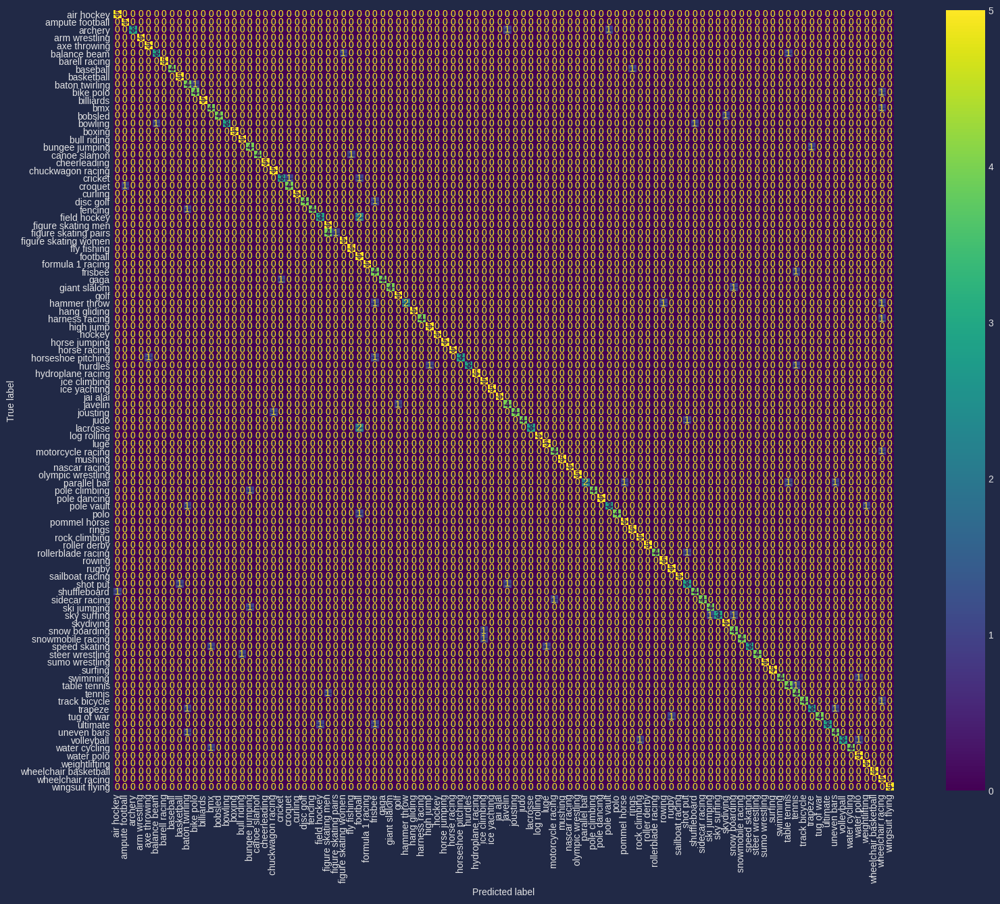

In [42]:
fig, ax = plt.subplots(figsize=(20, 15))
ConfusionMatrixDisplay.from_predictions(all_labels, all_preds, ax=ax, display_labels=train_dataset.classes, xticks_rotation='vertical')
plt.show()

модели сложно определить некоторые картинки и классифицировать их, так как классификация происходит на 1 слое, а остальные слои заморожены и обучены на других данных.
Разморозим слои которые отвечают за детализацию (3- выявление объектов и 4-более мелкие детали). Это поможет найти другие объекты  и детали, характерные для этого датасета и использовать их  вклассифкации.

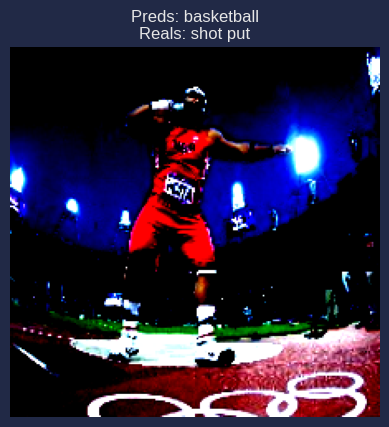

In [76]:
model.to(DEVICE)
model.eval()
images, labels = next(iter(valid_loader))
img = images[0]      
true_label = labels[0].item()

plt.imshow(img.permute(1, 2, 0).cpu().numpy())
with torch.inference_mode():
    # Добавляем размерность батча .unsqueeze(0) и кидаем на GPU
    logits = model(img.unsqueeze(0).to(DEVICE))
    pred_idx = logits.argmax(dim=1).item()

plt.axis('off')
# Выводим и предсказание, и реальный класс для проверки
plt.title(f'Preds: {idx2class[pred_idx]}\nReals: {idx2class[true_label]}')
plt.show()

In [77]:
# Морозим все слои
for param in model.parameters():
    param.requires_grad = False

# разморозим "layer3", "layer4", "fc"
for name, param in model.named_parameters():
    if any(x in name for x in ["layer3", "layer4", "fc"]):
        param.requires_grad = True
    else:
        param.requires_grad = False


In [78]:
print("Список размороженныхслоев:")
for name, param in model.named_parameters():
    if param.requires_grad:
        print(f"{name}")

Список размороженныхслоев:
layer3.0.conv1.weight
layer3.0.bn1.weight
layer3.0.bn1.bias
layer3.0.conv2.weight
layer3.0.bn2.weight
layer3.0.bn2.bias
layer3.0.downsample.0.weight
layer3.0.downsample.1.weight
layer3.0.downsample.1.bias
layer3.1.conv1.weight
layer3.1.bn1.weight
layer3.1.bn1.bias
layer3.1.conv2.weight
layer3.1.bn2.weight
layer3.1.bn2.bias
layer4.0.conv1.weight
layer4.0.bn1.weight
layer4.0.bn1.bias
layer4.0.conv2.weight
layer4.0.bn2.weight
layer4.0.bn2.bias
layer4.0.downsample.0.weight
layer4.0.downsample.1.weight
layer4.0.downsample.1.bias
layer4.1.conv1.weight
layer4.1.bn1.weight
layer4.1.bn1.bias
layer4.1.conv2.weight
layer4.1.bn2.weight
layer4.1.bn2.bias
fc.weight
fc.bias


Уменьшаем шаг обучения

In [79]:
# Снижаем lr
optimizer = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, model.parameters()), 
    lr=0.00005,
    weight_decay=0.05
)

In [80]:
if use_mlflow: 
    # Если MLFlow, то 
    mlflow.set_experiment(mlflow_experiment_name) # создаем эксперимент с именем mlflow_experiment_name. задан ранее
    with mlflow.start_run(run_name='SIC100_2'):
        # логгируем это
        mlflow.log_param('batch_size', config['batch_size'])
        mlflow.log_param('learning_rate', config['learning_rate'])
        mlflow.log_param('epochs', config['epochs'])
        mlflow.log_param('device', config['device'])

        # запуск обучения. передаем в том числе train_loader, valid_loader
        history_base = fit(model, config['epochs'], optimizer, train_loader, valid_loader)

        # сохраняем модель в MLFlow
        mlflow.pytorch.log_model(model, 'model')

else:
    history_base = fit(model, config['epochs'], optimizer, train_loader, valid_loader) 

_-_-_-_-_-_-_-_- Epoch - 0/15-_-_-_-_-_-_-_-_ | 
train_loss - 1.76394, train_acc - 0.74737 | 
valid_loss - 1.35208, valid_acc - 0.88597 | 
_-_-_-_-_-_-_-_-**********-_-_-_-_-_-_-_-_ | 
_-_-_-_-_-_-_-_- Epoch - 1/15-_-_-_-_-_-_-_-_ | 
train_loss - 1.63922, train_acc - 0.78721 | 
valid_loss - 1.32487, valid_acc - 0.89724 | 
_-_-_-_-_-_-_-_-**********-_-_-_-_-_-_-_-_ | 
_-_-_-_-_-_-_-_- Epoch - 2/15-_-_-_-_-_-_-_-_ | 
train_loss - 1.54000, train_acc - 0.82065 | 
valid_loss - 1.25896, valid_acc - 0.91767 | 
_-_-_-_-_-_-_-_-**********-_-_-_-_-_-_-_-_ | 
_-_-_-_-_-_-_-_- Epoch - 3/15-_-_-_-_-_-_-_-_ | 
train_loss - 1.49510, train_acc - 0.83415 | 
valid_loss - 1.24533, valid_acc - 0.91181 | 
_-_-_-_-_-_-_-_-**********-_-_-_-_-_-_-_-_ | 
_-_-_-_-_-_-_-_- Epoch - 4/15-_-_-_-_-_-_-_-_ | 
train_loss - 1.44815, train_acc - 0.85056 | 
valid_loss - 1.20699, valid_acc - 0.92788 | 
_-_-_-_-_-_-_-_-**********-_-_-_-_-_-_-_-_ | 
_-_-_-_-_-_-_-_- Epoch - 5/15-_-_-_-_-_-_-_-_ | 
train_loss - 1.42347, trai

2026/02/13 13:20:37 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2026/02/13 13:20:37 WARNING mlflow.pytorch: Saving pytorch model by Pickle or CloudPickle format requires exercising caution because these formats rely on Python's object serialization mechanism, which can execute arbitrary code during deserialization.The recommended safe alternative is to set 'export_model' to True to save the pytorch model using the safe graph model format.


_-_-_-_-_-_-_-_- Epoch - 14/15-_-_-_-_-_-_-_-_ | 
train_loss - 1.24853, train_acc - 0.90983 | 
valid_loss - 1.12943, valid_acc - 0.95808 | 
_-_-_-_-_-_-_-_-**********-_-_-_-_-_-_-_-_ | 


Время обучения модели рефрозен 10 минут 6 сек. на 15 эпохах.

In [81]:
result_history['defrozen_l3_l4_fc_model'] = history_base
result_history

{'Base_model': {'train_loss': [np.float64(3.6277950262006424),
   np.float64(2.585901939473446),
   np.float64(2.314598562593144),
   np.float64(2.183151642858135),
   np.float64(2.1037119790841055),
   np.float64(2.0644208322769093),
   np.float64(2.0369288870508635),
   np.float64(2.000731189669026),
   np.float64(1.9929057286248952),
   np.float64(1.9639846380288002),
   np.float64(1.9751953863984602),
   np.float64(1.9476262771687802),
   np.float64(1.9371030601844967),
   np.float64(1.945217642173948),
   np.float64(1.9239856462343043)],
  'valid_loss': [np.float64(2.289980411529541),
   np.float64(1.7728520333766937),
   np.float64(1.6140714585781097),
   np.float64(1.611947238445282),
   np.float64(1.5320143550634384),
   np.float64(1.5164297670125961),
   np.float64(1.5093792527914047),
   np.float64(1.509028360247612),
   np.float64(1.4928340464830399),
   np.float64(1.5001426935195923),
   np.float64(1.4955522567033768),
   np.float64(1.4964305758476257),
   np.float64(1.5191

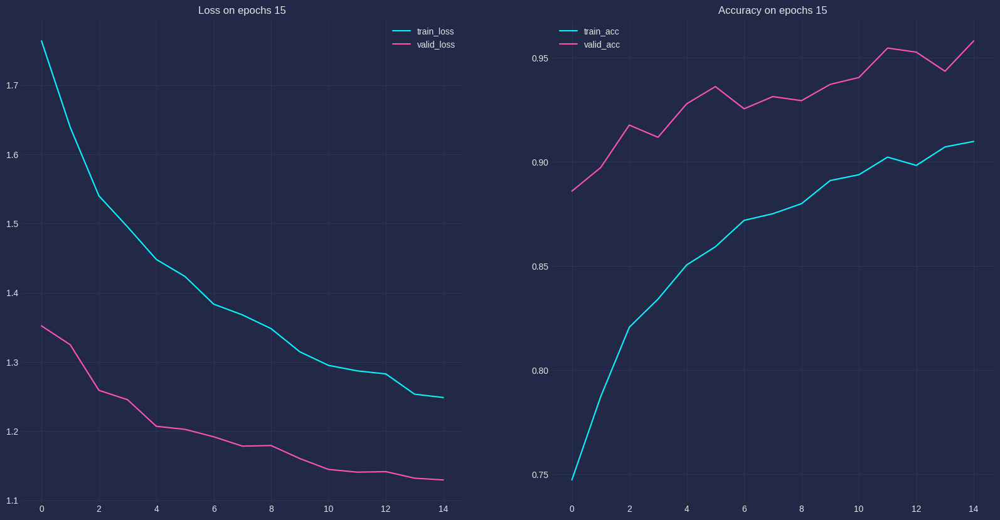

In [82]:
# метрики на аfine-tuning модели. разморожены l3, l4, fc. Шаг обучения 
plot_history(history_base)

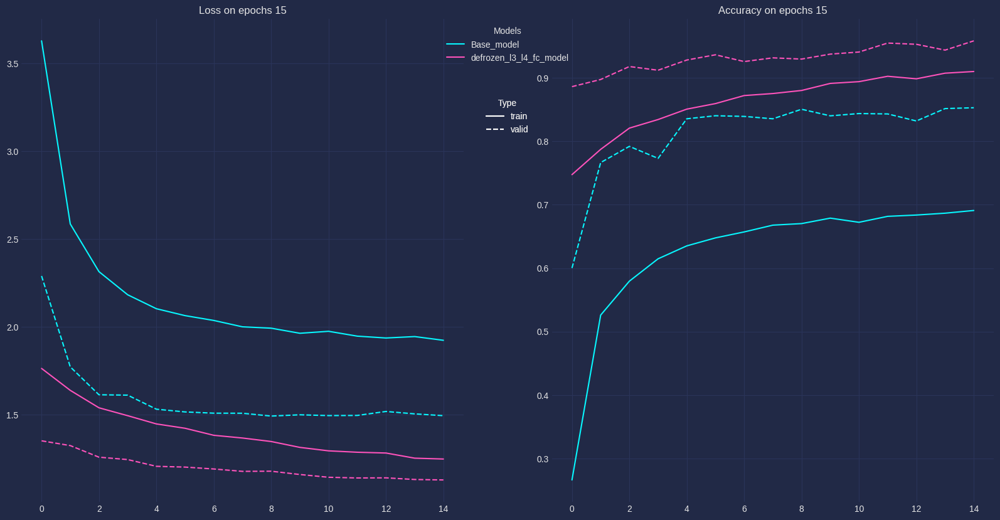

In [114]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))
for name, res_model in result_history.items():

    line, =  ax[0].plot(res_model['train_loss'], label=f'{name}', linestyle='-')
    ax[0].plot(res_model['valid_loss'], color=line.get_color(), linestyle='--')

    line, = ax[1].plot(res_model['train_acc'], label=f'{name}', linestyle='-')
    ax[1].plot(res_model['valid_acc'], color=line.get_color(), linestyle='--')
    ax[1].set_title(f'Accuracy on epochs {len(res_model['valid_acc'])}')
    ax[1].grid(True)
    # ax[1].legend()

ax[0].set_title(f'Loss on epochs {len(res_model['train_loss'])}')
ax[0].grid(True)

ax[1].set_title(f'Accuracy on epochs {len(res_model['valid_acc'])}')
ax[1].grid(True)

# легенда цвета
leg1 = ax[1].legend(loc='upper center', bbox_to_anchor=(-0.1, 1), title="Models")
ax[1].add_artist(leg1) 

# пустые линии для легенды линий
l_train, = ax[1].plot([], [], color='white', linestyle='-', label='train')
l_valid, = ax[1].plot([], [], color='white', linestyle='--', label='valid')

leg2 = ax[1].legend(handles=[l_train, l_valid], loc='upper center', bbox_to_anchor=(-0.1, 0.85), title="Type")
ax[1].add_artist(leg2) 

# plt.grid(True, alpha=0.1)
plt.show()

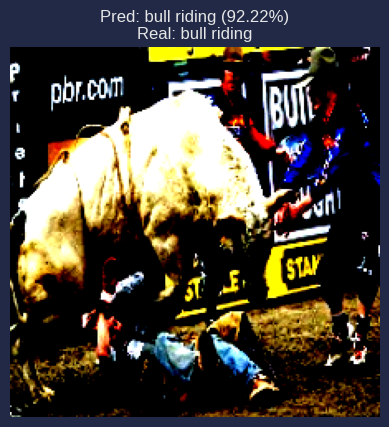

In [121]:
model.to(DEVICE)
model.eval()

images, labels = next(iter(valid_loader))
img = images[0]      
true_label = labels[0].item()

plt.imshow(img.permute(1, 2, 0).cpu().numpy())

with torch.inference_mode():
    logits = model(img.unsqueeze(0).to(DEVICE))

    probs = torch.softmax(logits, dim=1) 

    prob, pred_idx = torch.max(probs, dim=1)

    pred_idx = pred_idx.item()
    confidence = prob.item()

plt.axis('off')
plt.title(f'Pred: {idx2class[pred_idx]} ({confidence:.2%})\nReal: {idx2class[true_label]}')
plt.show()

In [122]:
def get_classification_report(model, loader, device, classes):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in loader:
            outputs = model(inputs.to(device))
            preds = torch.argmax(outputs, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.numpy())

    print(classification_report(all_labels, all_preds, target_names=classes))

get_classification_report(model, valid_loader, DEVICE, train_dataset.classes)

                       precision    recall  f1-score   support

           air hockey       0.83      1.00      0.91         5
      ampute football       1.00      1.00      1.00         5
              archery       0.83      1.00      0.91         5
        arm wrestling       1.00      1.00      1.00         5
         axe throwing       1.00      1.00      1.00         5
         balance beam       0.80      0.80      0.80         5
        barell racing       1.00      1.00      1.00         5
             baseball       1.00      1.00      1.00         5
           basketball       1.00      1.00      1.00         5
       baton twirling       0.71      1.00      0.83         5
            bike polo       1.00      1.00      1.00         5
            billiards       1.00      1.00      1.00         5
                  bmx       0.83      1.00      0.91         5
              bobsled       1.00      1.00      1.00         5
              bowling       1.00      1.00      1.00  

Метрики значительно лучше базовых. Accuracy = 0.96

In [ ]:
# 1. Получаем предсказания на валидации
model.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for inputs, labels in valid_loader:
        outputs = model(inputs.to(DEVICE))
        preds = torch.argmax(outputs, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.numpy())

# 2. Выводим отчет
# target_names — это список названий видов спорта (train_dataset.classes)
print(classification_report(all_labels, all_preds, target_names=train_dataset.classes))

                       precision    recall  f1-score   support

           air hockey       0.83      1.00      0.91         5
      ampute football       1.00      1.00      1.00         5
              archery       0.83      1.00      0.91         5
        arm wrestling       1.00      1.00      1.00         5
         axe throwing       1.00      1.00      1.00         5
         balance beam       0.80      0.80      0.80         5
        barell racing       1.00      1.00      1.00         5
             baseball       1.00      1.00      1.00         5
           basketball       1.00      1.00      1.00         5
       baton twirling       0.71      1.00      0.83         5
            bike polo       1.00      1.00      1.00         5
            billiards       1.00      1.00      1.00         5
                  bmx       0.83      1.00      0.91         5
              bobsled       1.00      1.00      1.00         5
              bowling       1.00      1.00      1.00  

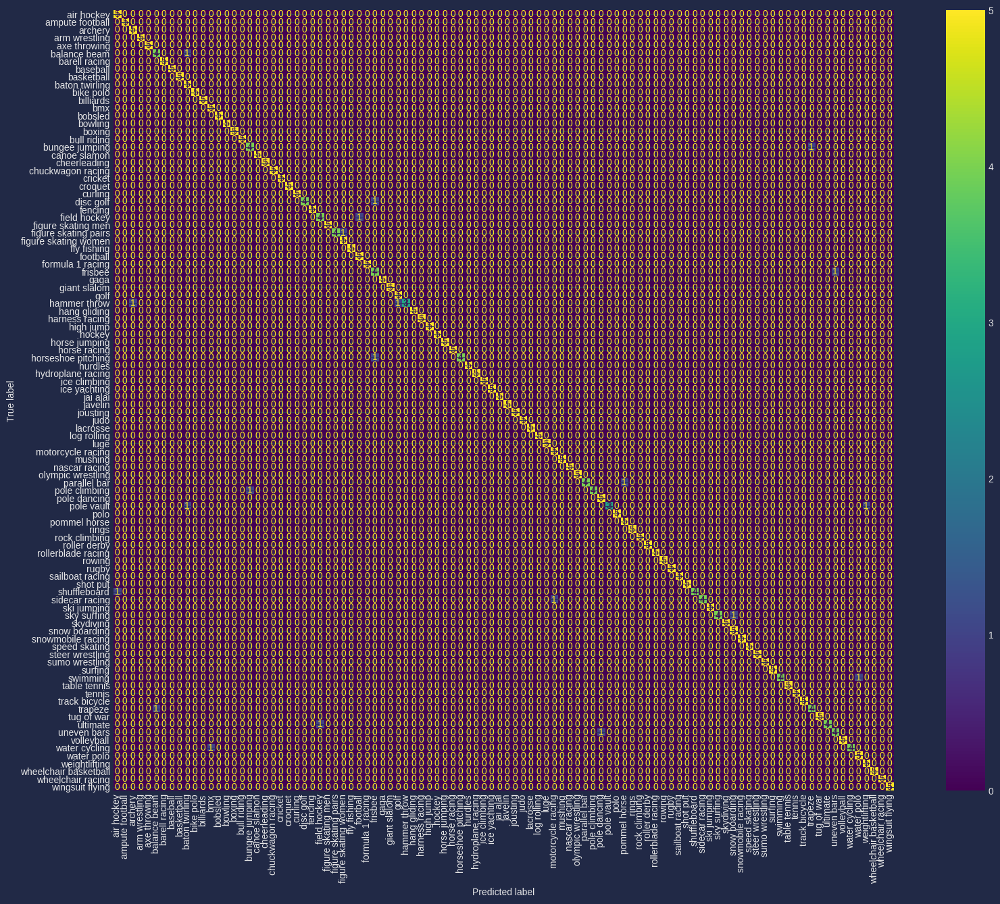

In [111]:
fig, ax = plt.subplots(figsize=(20, 15))
ConfusionMatrixDisplay.from_predictions(all_labels, all_preds, ax=ax, display_labels=train_dataset.classes, xticks_rotation='vertical')
plt.show()

ConfusionMatrix стала занчительно чище

In [112]:
get_worst_classes_report(model, valid_loader, DEVICE, train_dataset.classes)


--- ТОП-10 ХУДШИХ КЛАССОВ (по точности) ---
               Спорт  Accuracy
          pole vault       0.6
        hammer throw       0.6
        balance beam       0.8
        field hockey       0.8
           disc golf       0.8
  horseshoe pitching       0.8
figure skating pairs       0.8
      bungee jumping       0.8
             frisbee       0.8
        parallel bar       0.8


уменьшилось количество классов с точностью 0,6 до 2х с 

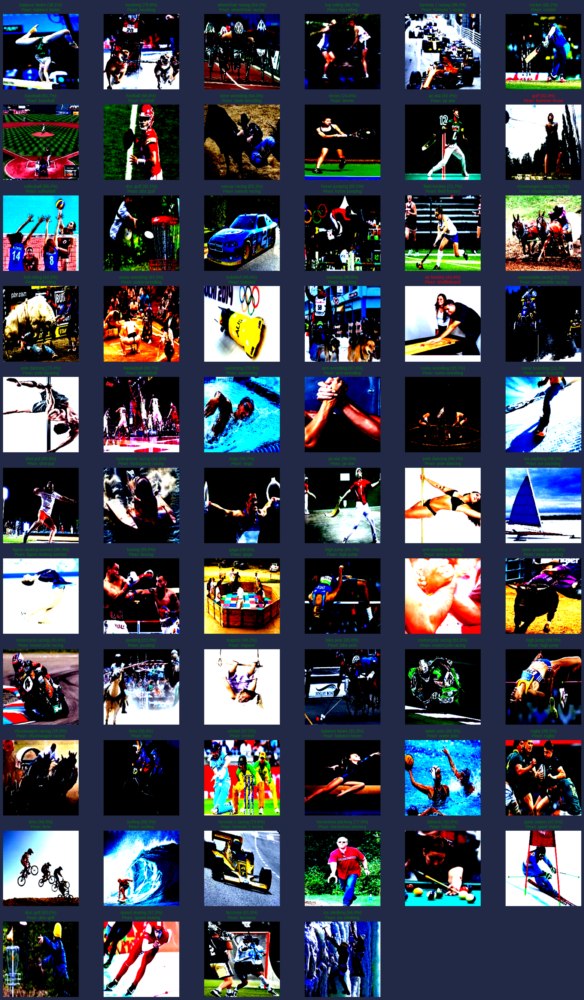

In [ ]:

# переводим модель в режим предсказания
model.eval()
images, labels = next(iter(valid_loader))

with torch.no_grad():
    output = model(images.to(DEVICE))
    probs = torch.softmax(output, dim=1) # Считаем вероятности
    conf, y_pred = probs.max(1)          # Берем уверенность и индекс класса

cols = 6
rows = math.ceil(len(labels) / cols)
fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 3))

for ax, img, p, label, c in zip(axes.flat, images, y_pred, labels, conf):
    ax.imshow(img.permute(1, 2, 0).cpu())
    
    # Короткий заголовок: Класс и % уверенности
    ax.set_title(f"{idx2class[p.item()]} ({c:.1%})\nРеал: {idx2class[label.item()]}", 
                 color='green' if p == label else 'red', fontsize=10)
    ax.axis('off')

for i in range(len(images), len(axes.flat)):
    axes.flat[i].remove()
    

plt.tight_layout()
plt.show()

In [124]:
# 1. Получаем предсказания на валидации
model.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for inputs, labels in test_loader:
        outputs = model(inputs.to(DEVICE))
        preds = torch.argmax(outputs, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.numpy())

# 2. Выводим отчет
# target_names — это список названий видов спорта (train_dataset.classes)
print(classification_report(all_labels, all_preds, target_names=train_dataset.classes))

                       precision    recall  f1-score   support

           air hockey       1.00      1.00      1.00         5
      ampute football       1.00      1.00      1.00         5
              archery       0.80      0.80      0.80         5
        arm wrestling       1.00      1.00      1.00         5
         axe throwing       1.00      1.00      1.00         5
         balance beam       0.71      1.00      0.83         5
        barell racing       1.00      1.00      1.00         5
             baseball       1.00      0.80      0.89         5
           basketball       1.00      1.00      1.00         5
       baton twirling       1.00      0.80      0.89         5
            bike polo       1.00      1.00      1.00         5
            billiards       1.00      1.00      1.00         5
                  bmx       1.00      1.00      1.00         5
              bobsled       0.83      1.00      0.91         5
              bowling       1.00      0.80      0.89  

значения на тестовом наборе данных 

             accuracy                           0.96       500
            macro avg       0.97      0.96      0.96       500
         weighted avg       0.97      0.96      0.96       500

значения на валидационном наборе данных

             accuracy                           0.96       500
            macro avg       0.96      0.96      0.96       500
         weighted avg       0.96      0.96      0.96       500

модель не переобучиласт и предсказывает с точностю 0,96.

Сохраняем модель в каталог models

In [125]:
path_save = r'../models/model_sic100.pt'
torch.save(model.state_dict(), path_save)
print("Модель успешно сохранена!")

Модель успешно сохранена!


Сохранение словаря классов

In [150]:
path_save_json = r'../models/classes_sic100.json'
with open(path_save_json, 'w', encoding='utf-8') as f:
    json.dump(idx2class, f, ensure_ascii=False, indent=4)

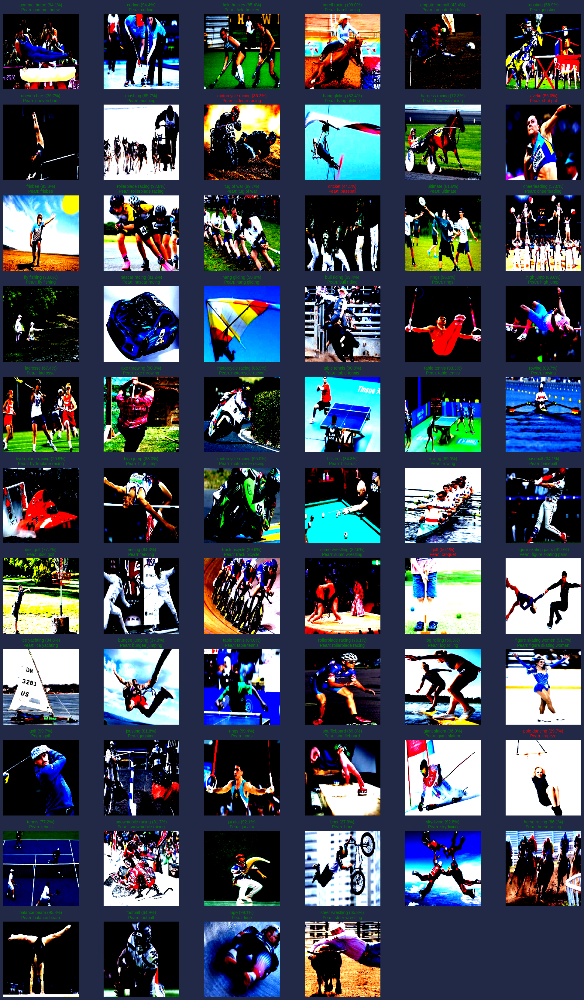

In [126]:
model.eval()
images, labels = next(iter(test_loader))

with torch.no_grad():
    output = model(images.to(DEVICE))
    probs = torch.softmax(output, dim=1) # Считаем вероятности
    conf, y_pred = probs.max(1)          # Берем уверенность и индекс класса

cols = 6
rows = math.ceil(len(labels) / cols)
fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 3))

for ax, img, p, label, c in zip(axes.flat, images, y_pred, labels, conf):
    ax.imshow(img.permute(1, 2, 0).cpu())
    
    # Короткий заголовок: Класс и % уверенности
    ax.set_title(f"{idx2class[p.item()]} ({c:.1%})\nРеал: {idx2class[label.item()]}", 
                 color='green' if p == label else 'red', fontsize=10)
    ax.axis('off')

for i in range(len(images), len(axes.flat)):
    axes.flat[i].remove()
    

plt.tight_layout()
plt.show()

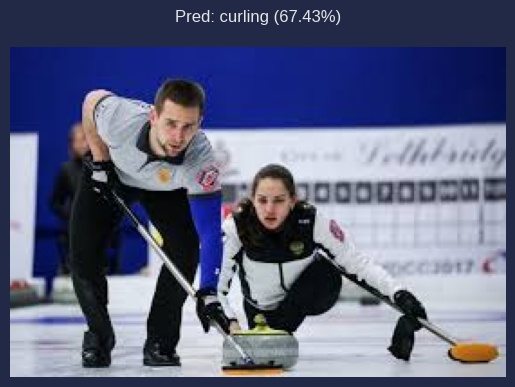

In [133]:
import requests
from PIL import Image

def get_prediction(url, model, transform, class_names):

    response = requests.get(url, stream=True)
    img = Image.open(response.raw).convert('RGB')
    
    input_tensor = transform(img).unsqueeze(0).to(DEVICE)
    
    model.eval()
    with torch.no_grad():
        logits = model(input_tensor)

        probs = torch.softmax(logits, dim=1) 

        prob, pred_idx = torch.max(probs, dim=1)

        pred_idx = pred_idx.item()
        confidence = prob.item()

    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Pred: {idx2class[pred_idx]} ({confidence:.2%})\n')
    plt.show()


url = "https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcSNDyi3zmbVPExT64kcPGsWv6N3nZR-Va6Sig&s"
get_prediction(url, model, transform_valid, idx2class)

Считаем Weighted F1-Score и Macro F1-Score. 

In [151]:
from sklearn.metrics import f1_score, classification_report

model.eval()
y_true = []
y_pred = []

with torch.no_grad():
    for images, labels in valid_loader: # ваш загрузчик валидационных данных
        images, labels = images.to(DEVICE), labels.to(DEVICE)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        
        y_true.extend(labels.cpu().numpy())
        y_pred.extend(predicted.cpu().numpy())


# Weighted: среднее значение, взвешенное по количеству элементов в каждом классе
f1_weighted = f1_score(y_true, y_pred, average='weighted')
print(f"Weighted F1-Score: {f1_weighted:.4f}")

# Macro: простое среднее (все 100 классов считаются равноценными, даже если в одном 10 фото, а в другом 100)
f1_macro = f1_score(y_true, y_pred, average='macro')
print(f"Macro F1-Score: {f1_macro:.4f}")

Weighted F1-Score: 0.9575
Macro F1-Score: 0.9575
